# Import library

In [2]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Data Overview

In [3]:
ob_data = pd.read_csv('ObesityDataSet_raw_and_data_sinthetic.csv')
ob_data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Female,21.0,1.62,64.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,0.0,1.0,no,Public_Transportation,Normal_Weight
1,Female,21.0,1.52,56.0,yes,no,3.0,3.0,Sometimes,yes,3.0,yes,3.0,0.0,Sometimes,Public_Transportation,Normal_Weight
2,Male,23.0,1.80,77.0,yes,no,2.0,3.0,Sometimes,no,2.0,no,2.0,1.0,Frequently,Public_Transportation,Normal_Weight
3,Male,27.0,1.80,87.0,no,no,3.0,3.0,Sometimes,no,2.0,no,2.0,0.0,Frequently,Walking,Overweight_Level_I
4,Male,22.0,1.78,89.8,no,no,2.0,1.0,Sometimes,no,2.0,no,0.0,0.0,Sometimes,Public_Transportation,Overweight_Level_II


In [4]:
ob_data.dtypes

Gender                             object
Age                               float64
Height                            float64
Weight                            float64
family_history_with_overweight     object
FAVC                               object
FCVC                              float64
NCP                               float64
CAEC                               object
SMOKE                              object
CH2O                              float64
SCC                                object
FAF                               float64
TUE                               float64
CALC                               object
MTRANS                             object
NObeyesdad                         object
dtype: object

In [5]:
ob_data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,2111.0,24.312600,6.345968,14.00,19.947192,22.777890,26.000000,61.00
Height,2111.0,1.701677,0.093305,1.45,1.630000,1.700499,1.768464,1.98
Weight,2111.0,86.586058,26.191172,39.00,65.473343,83.000000,107.430682,173.00
FCVC,2111.0,2.419043,0.533927,1.00,2.000000,2.385502,3.000000,3.00
NCP,2111.0,2.685628,0.778039,1.00,2.658738,3.000000,3.000000,4.00
CH2O,2111.0,2.008011,0.612953,1.00,1.584812,2.000000,2.477420,3.00
FAF,2111.0,1.010298,0.850592,0.00,0.124505,1.000000,1.666678,3.00
TUE,2111.0,0.657866,0.608927,0.00,0.000000,0.625350,1.000000,2.00


# Data Cleaning

In [6]:
#Make the data efficient
ob_data = ob_data.astype({col: 'float32' for col in ob_data.select_dtypes(include='float').columns})

In [7]:
ob_data.isna().sum() / ob_data.shape[0]

Gender                            0.0
Age                               0.0
Height                            0.0
Weight                            0.0
family_history_with_overweight    0.0
FAVC                              0.0
FCVC                              0.0
NCP                               0.0
CAEC                              0.0
SMOKE                             0.0
CH2O                              0.0
SCC                               0.0
FAF                               0.0
TUE                               0.0
CALC                              0.0
MTRANS                            0.0
NObeyesdad                        0.0
dtype: float64

In [8]:
print(ob_data.duplicated().sum())
ob_data.drop_duplicates(inplace=True)

24


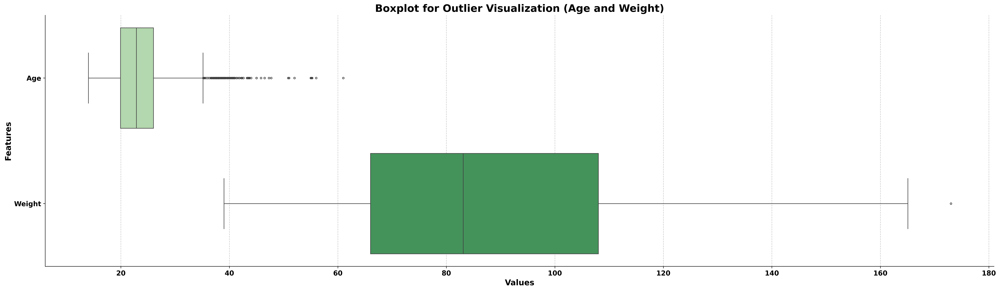

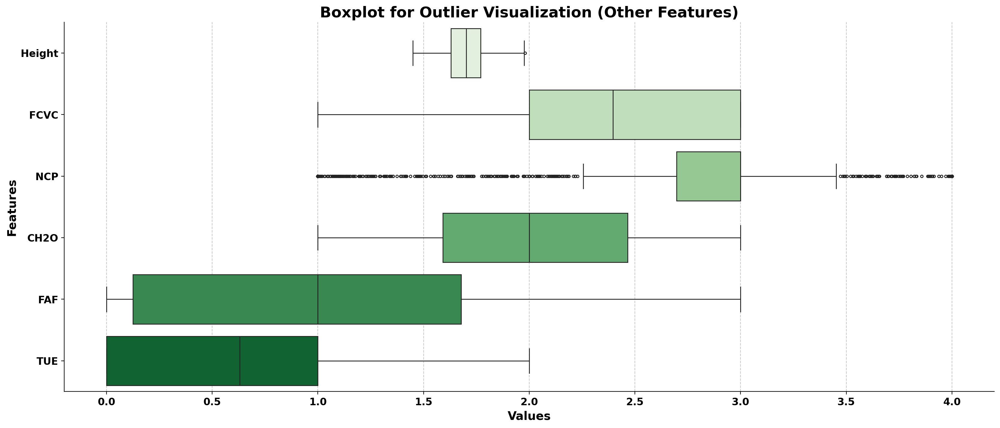

In [9]:
# Visualize outliers for Age and Weight using boxplot
plt.figure(figsize=(30, 8), dpi=500)
sns.boxplot(
    data=ob_data[['Age', 'Weight']], 
    palette='Greens', 
    orient='h',
    flierprops=dict(marker='o', color='red', markersize=3)
)
plt.title('Boxplot for Outlier Visualization (Age and Weight)', fontsize=18, fontweight='bold')
plt.xlabel('Values', fontsize=14, fontweight='bold')
plt.ylabel('Features', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.7)
sns.despine()
plt.show()

# Visualize outliers for other features using boxplot
plt.figure(figsize=(20, 8), dpi=200)
sns.boxplot(
    data=ob_data[['Height', 'FCVC', 'NCP', 'CH2O', 'FAF', 'TUE']], 
    palette='Greens', 
    orient='h',
    flierprops=dict(marker='o', color='red', markersize=3)
)
plt.title('Boxplot for Outlier Visualization (Other Features)', fontsize=18, fontweight='bold')
plt.xlabel('Values', fontsize=14, fontweight='bold')
plt.ylabel('Features', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.7)
sns.despine()
plt.show()

we keep the outlier because the data relevant into obesity level 

# EDA

In [10]:
ob_data['BMI'] = ob_data['Weight'] / ((ob_data['Height']) ** 2)
df = ob_data.copy()

## Univariate Analysis

In [11]:
import matplotlib.pyplot as plt
import seaborn as sns

def univariate_numeric_dist(column):

    plt.figure(figsize=(12, 6))
    sns.histplot(ob_data[column], kde=True, color="dodgerblue", edgecolor="black", alpha=0.7)
    plt.title(f'Distribution of {column}', fontsize=16, fontweight='bold', color="navy")
    plt.xlabel(column, fontsize=14, fontweight='bold')
    plt.ylabel('Frequency', fontsize=14, fontweight='bold')
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    sns.despine()
    plt.show()

### Age

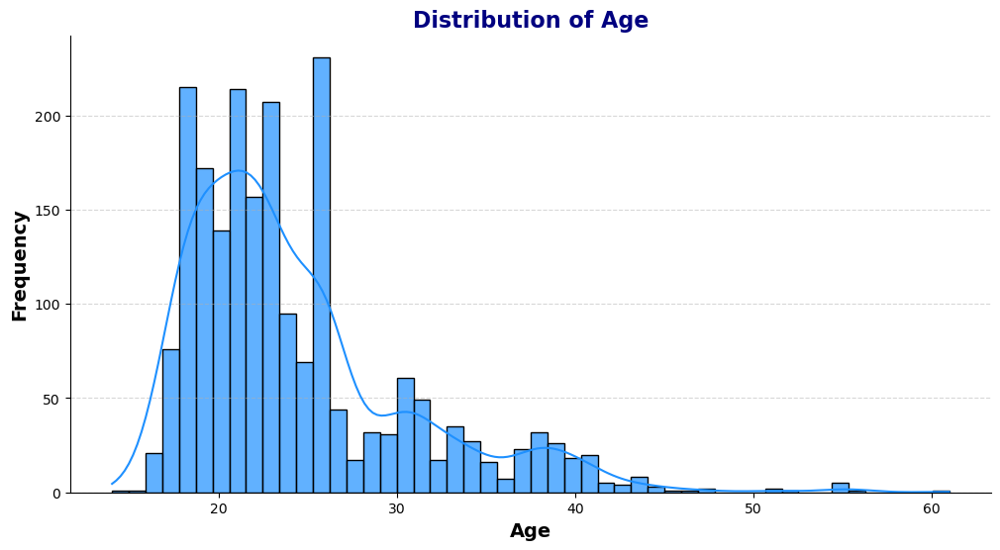

In [12]:
univariate_numeric_dist('Age')
df['Age'] = df['Age'].transform(lambda x: np.log(x))

### Height

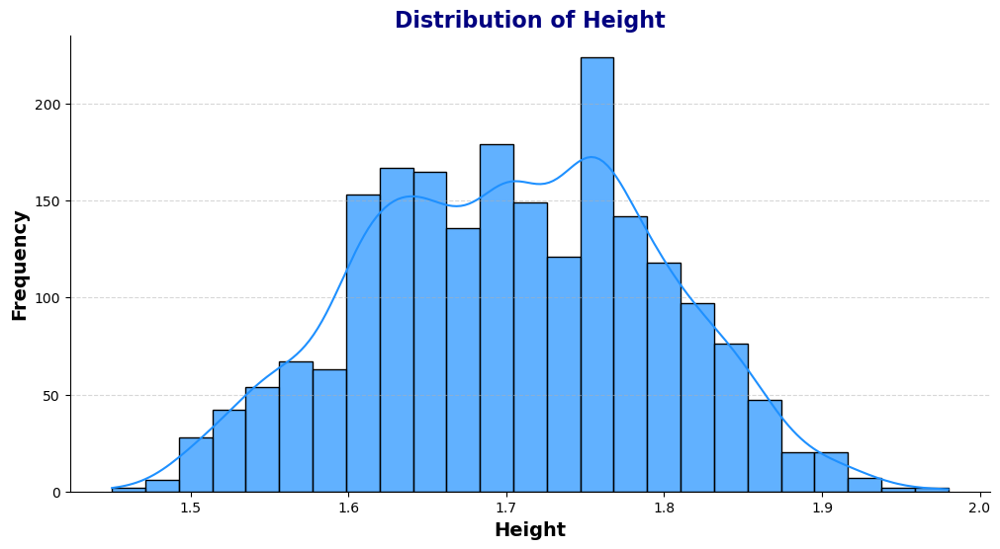

In [13]:
univariate_numeric_dist('Height')

### Weight

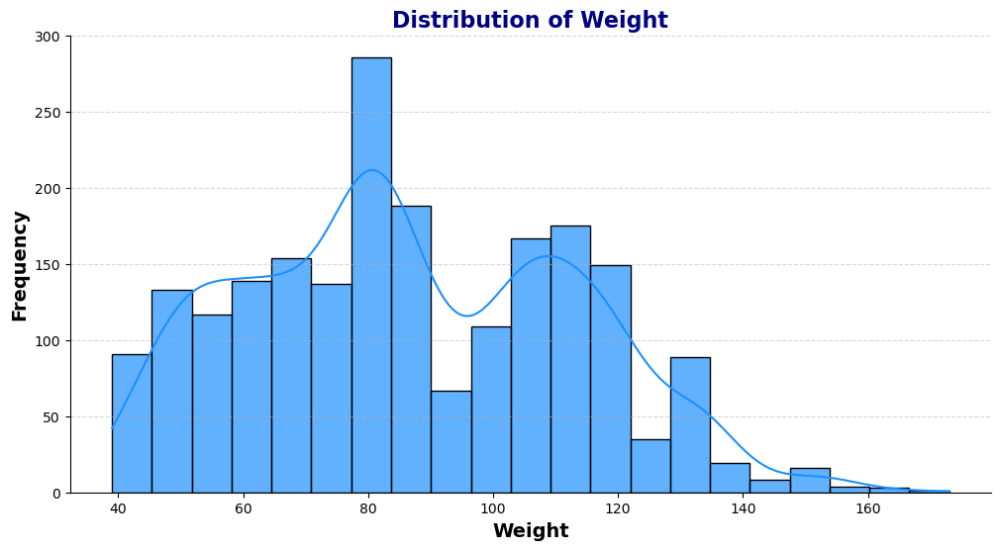

In [14]:
univariate_numeric_dist('Weight')
df['Weight'] = df['Weight'].transform(lambda x: np.log(x))

### FCVC

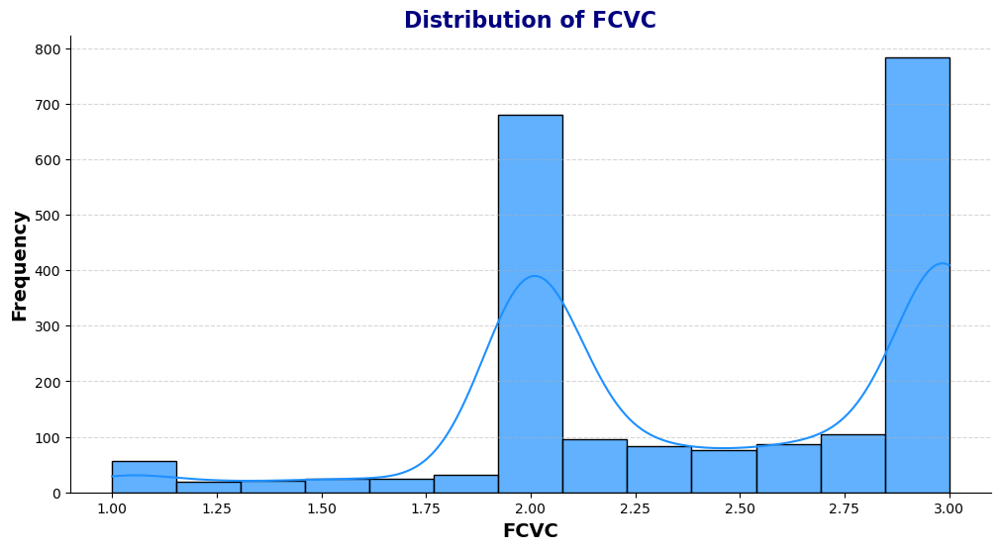

In [15]:
univariate_numeric_dist('FCVC')
df['FCVC'] = df['FCVC'].round()

### NCP

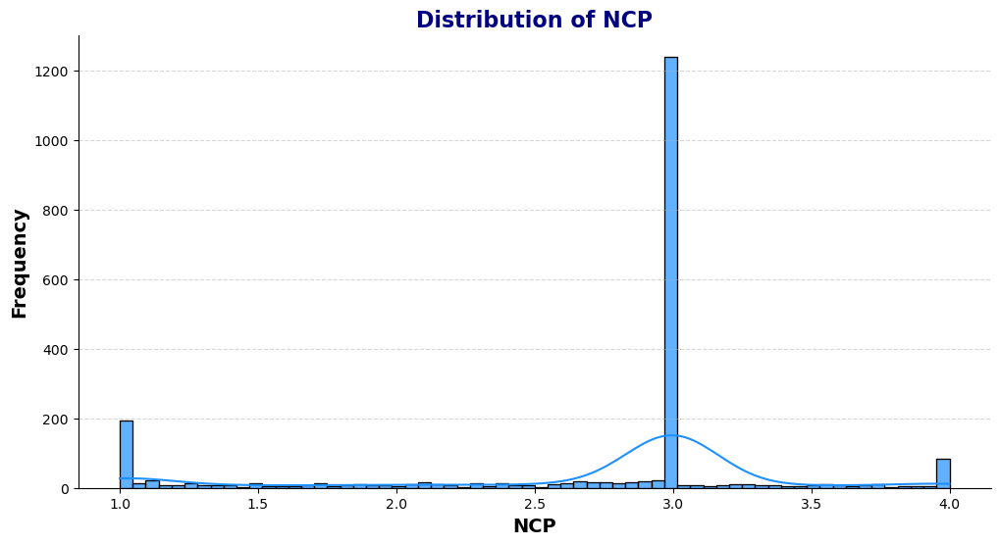

In [16]:
univariate_numeric_dist('NCP')
df['NCP'] = df['NCP'].round()

### CH20

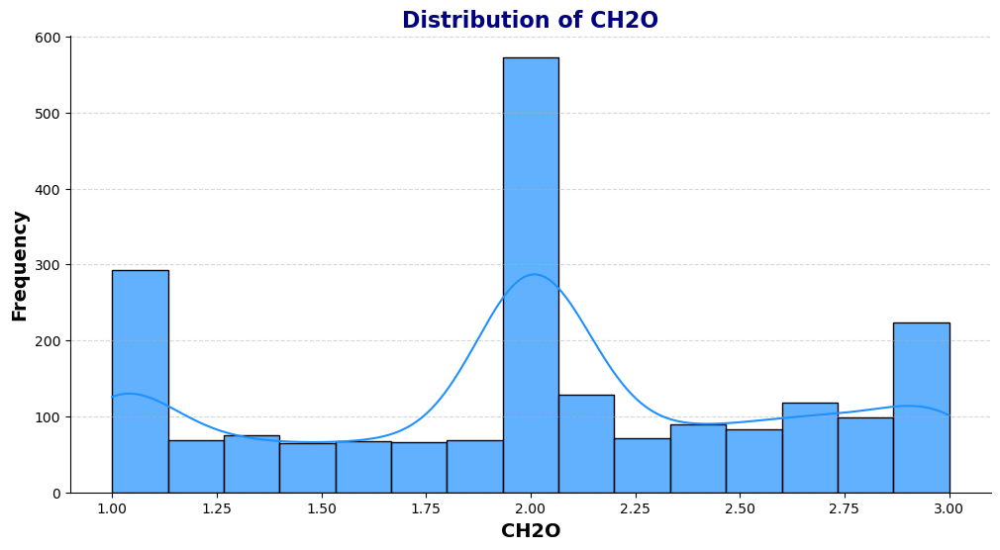

In [17]:
univariate_numeric_dist('CH2O')

### FAF

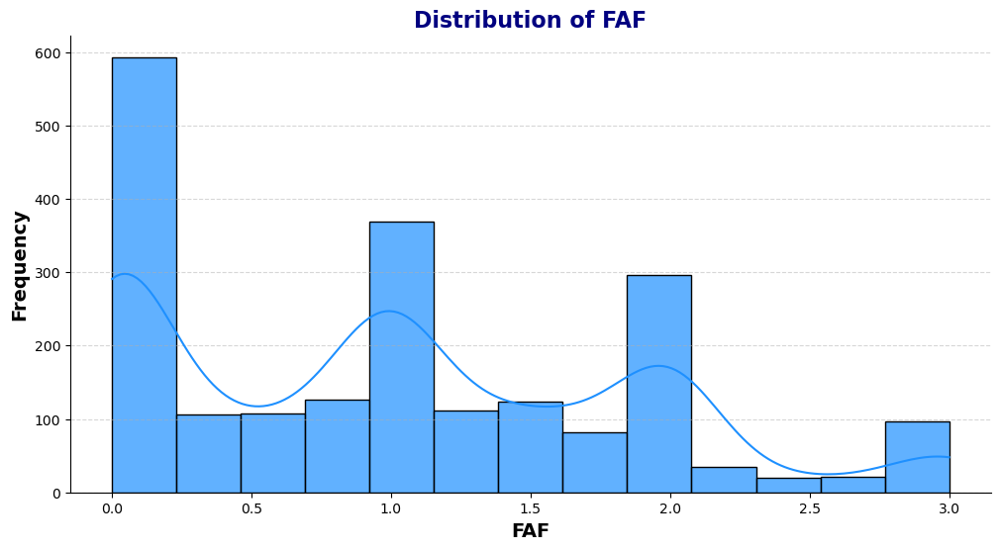

In [18]:
univariate_numeric_dist('FAF')

### TUE

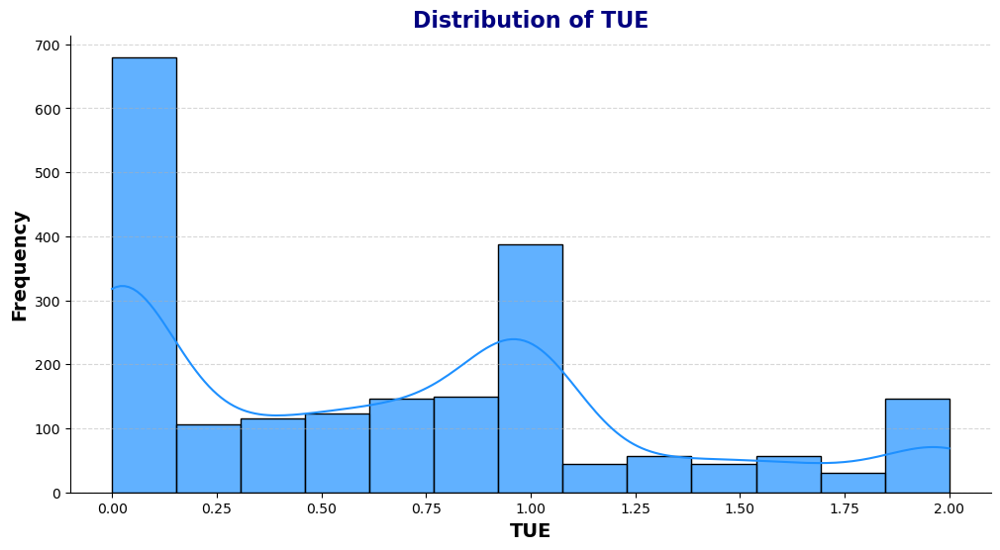

In [19]:
univariate_numeric_dist('TUE')

### NObeyesdad

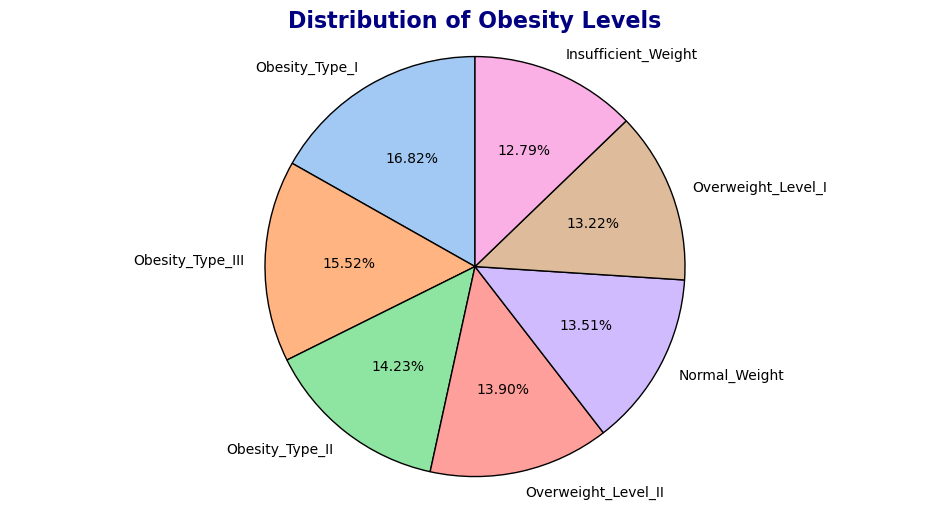

In [20]:
plt.figure(figsize=(12, 6))
df['NObeyesdad'].value_counts().plot(
    kind='pie', 
    autopct='%1.2f%%', 
    colors=sns.color_palette('pastel'), 
    startangle=90, 
    wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True}
)
plt.title('Distribution of Obesity Levels', fontsize=16, fontweight='bold', color='navy')
plt.ylabel('')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.show()

## Bivariate Analysis

In [21]:
def biivariate_categorical(col1):
    plt.figure(figsize=(12, 6))
    sns.countplot(data=ob_data, x=col1, hue='NObeyesdad', palette='bright', alpha=0.8)
    plt.title(f'Distribution of NObeyesdad by {col1}', fontsize=16, fontweight='bold', color='navy')
    plt.xlabel(col1, fontsize=14, fontweight='bold')
    plt.ylabel('Count', fontsize=14, fontweight='bold')
    plt.xticks(rotation=0)
    plt.legend(title='Class Weight', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    sns.despine()
    plt.show()

def biivariate_numerical(column):
    plt.figure(figsize=(16, 8))
    sns.kdeplot(data=ob_data, x=column, hue='NObeyesdad', fill=True, palette='bright', common_norm=False)
    plt.title(f'KDE Plot of Obesity Levels by {column}', fontsize=16, fontweight='bold', color='navy')
    plt.xlabel(column, fontsize=14, fontweight='bold')
    plt.ylabel('Density', fontsize=14, fontweight='bold')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    sns.despine()
    plt.show()

### Obesity level by Gender

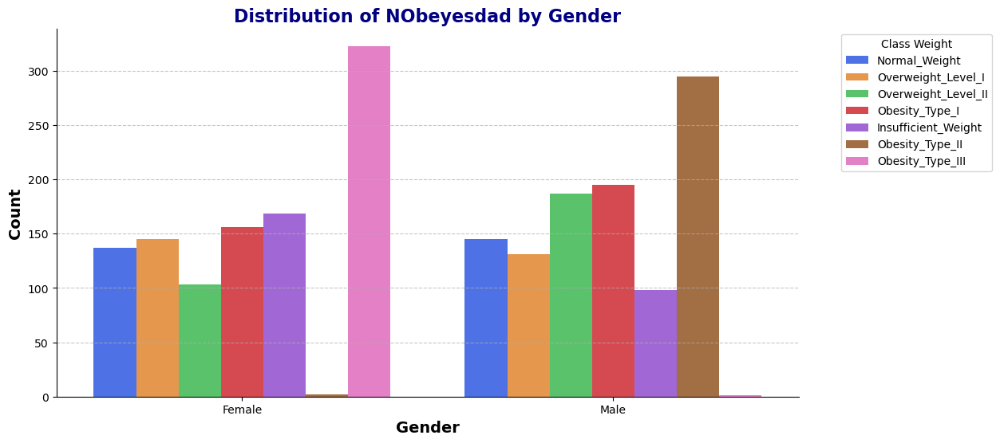

In [22]:
biivariate_categorical('Gender')

- Female have a tendency towards obesity level 3 while male have level 2
- Female tend to be underweight

### Obesity level by Age

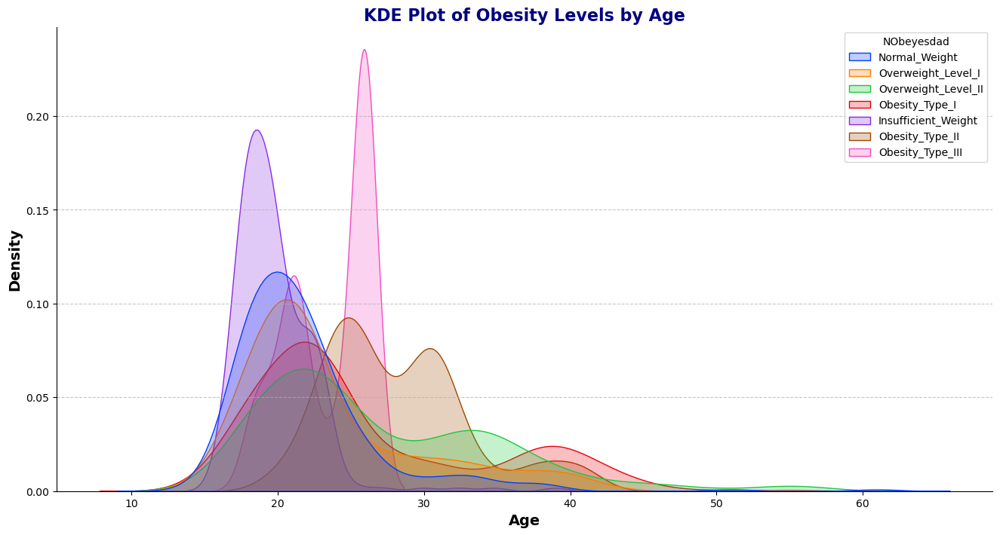

In [23]:
biivariate_numerical('Age')

- The 15 - 20 age group tends to be underweight
- The 22 - 30 age group tends to have grade 3 obesity

### Obesity level by Height

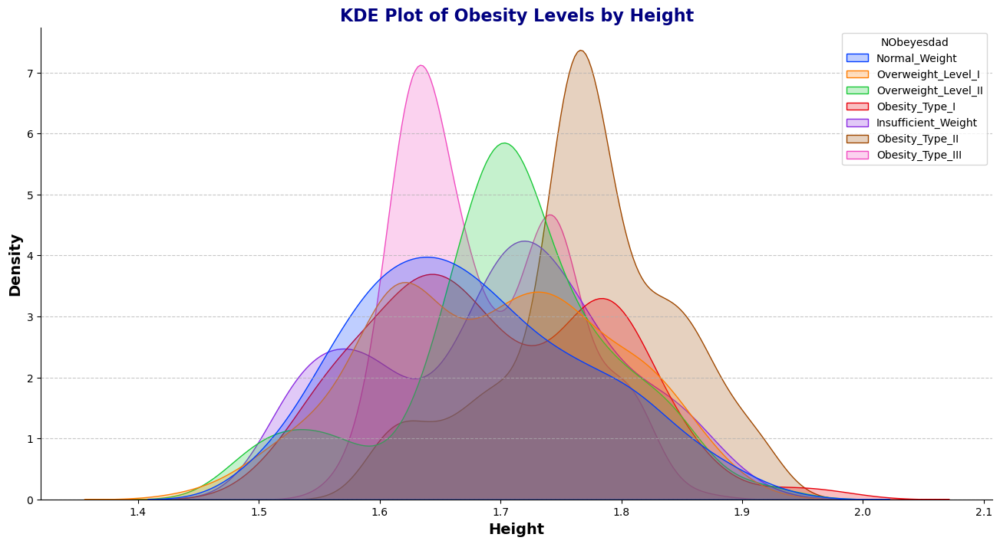

In [24]:
biivariate_numerical('Height')

### Obesity level by Weight

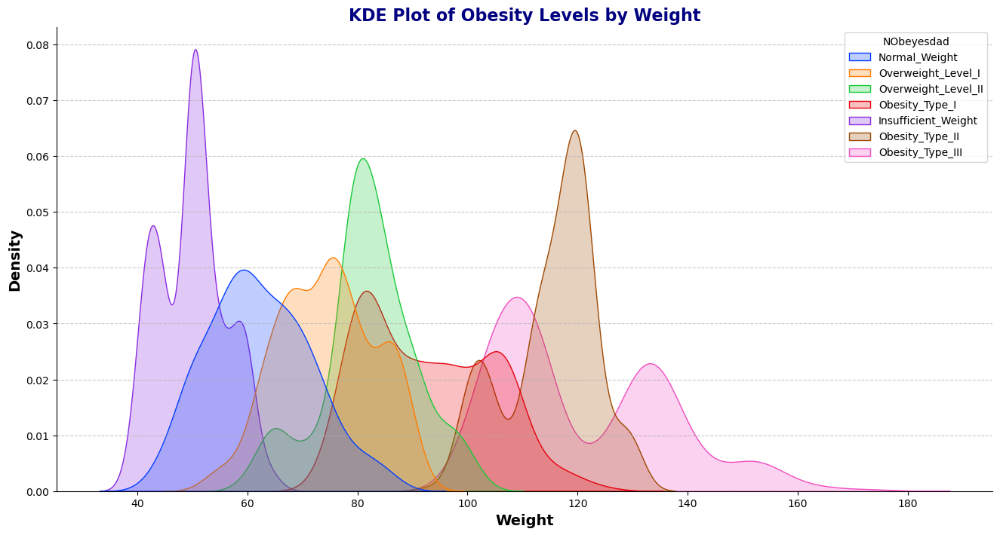

In [25]:
biivariate_numerical('Weight')

- Mudah membedakan kelas berat dengan hanya menggunakan beratnya saja, namun dapat untuk detailnya dapat menggunakan BMI`

### Obesity level by BMI

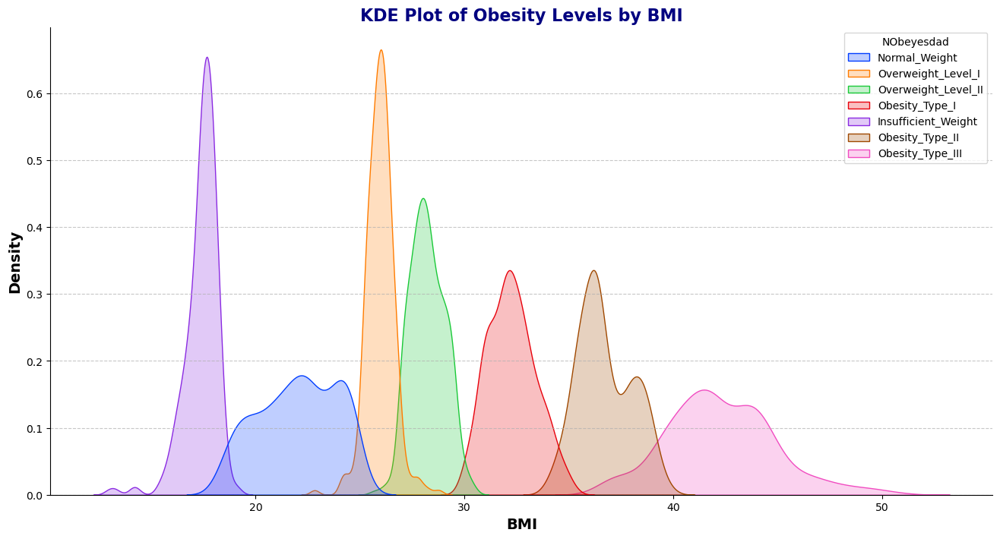

In [26]:
biivariate_numerical('BMI')

- BMI features can help differentiate obesity classes better

### Obesity level by family_history_with_overweight

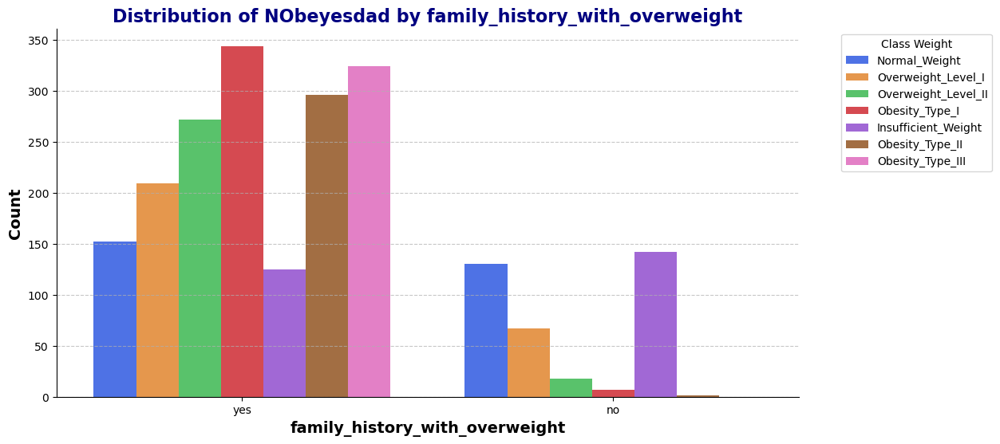

In [27]:
biivariate_categorical('family_history_with_overweight')

- People with obesity tend to have overweight family history

### Obesity level by FAVC (Whether eats high-calorie food frequently)

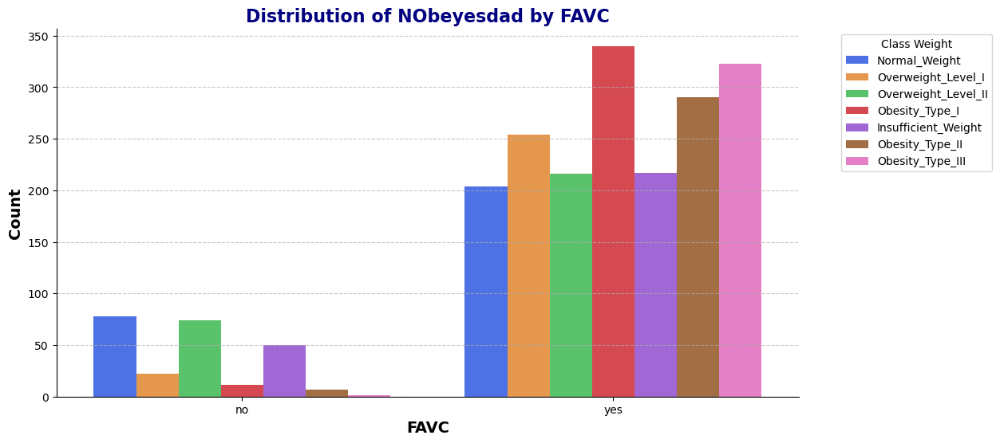

In [28]:
biivariate_categorical('FAVC')

- People that eats high calorie food frequently prone to obesity

### Obesity level by FCVC (Frequency of vegetable consumption in meals)

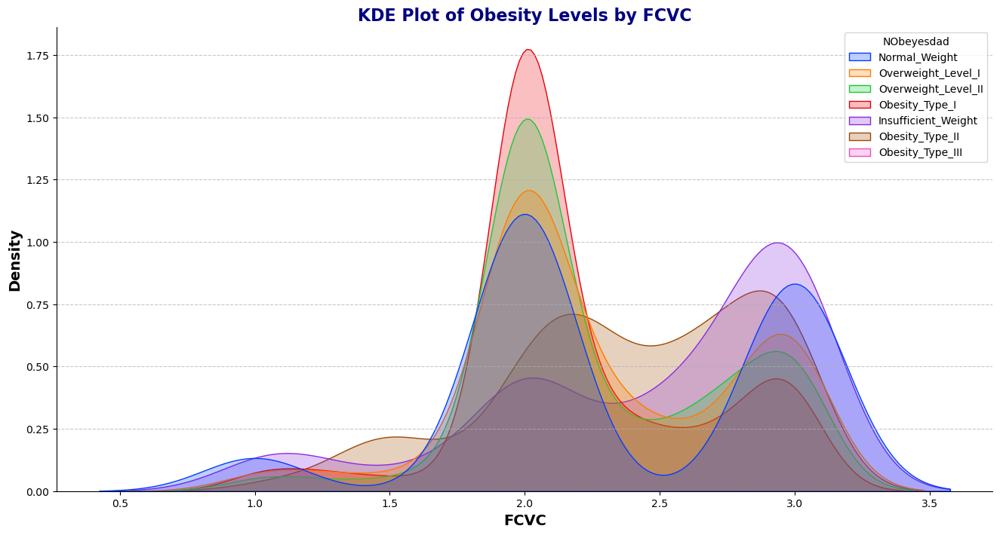

In [29]:
biivariate_numerical('FCVC')

- The intensity of eating lots of vegetables does not always make people obese

### Obesity level by CAEC  (Food consumption between meals)

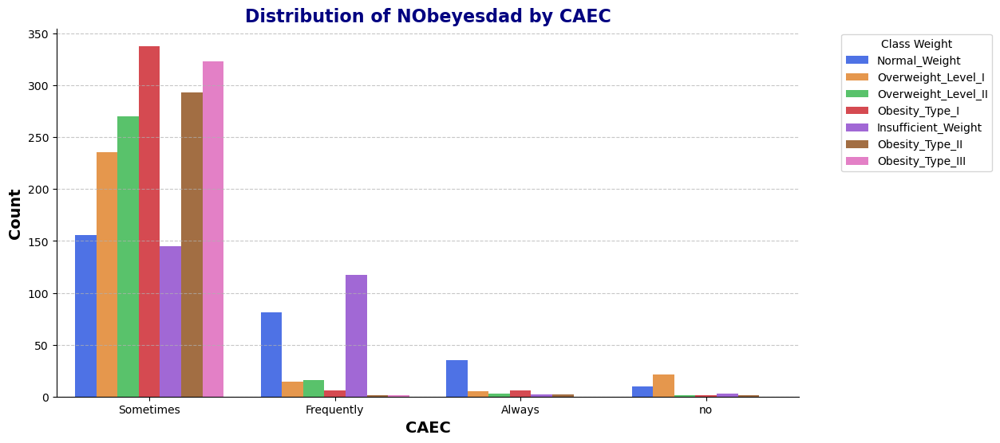

In [30]:
biivariate_categorical('CAEC')

- The intensity of having food between meals not always make obesity

### Obesity level by SMOKE

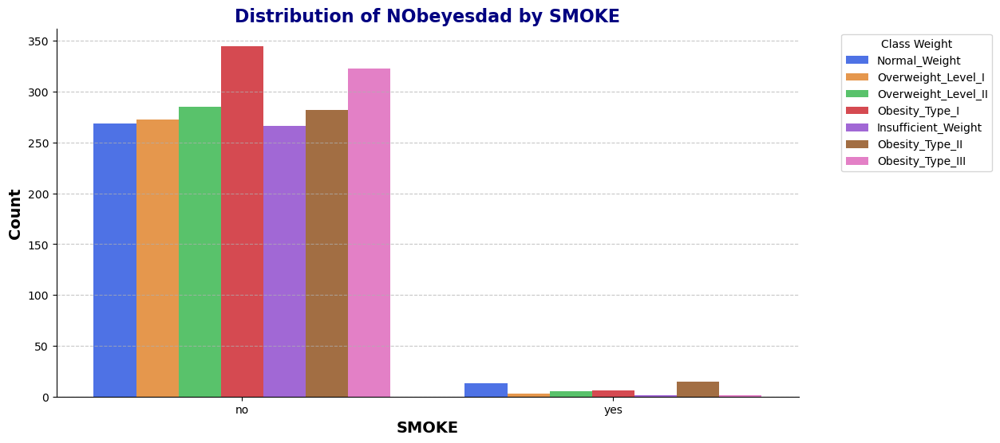

In [31]:
biivariate_categorical('SMOKE')

- Non-smokers tend to be obese (assumed because they spend more money on smoking and vice versa)

### Obesity level by CH2O

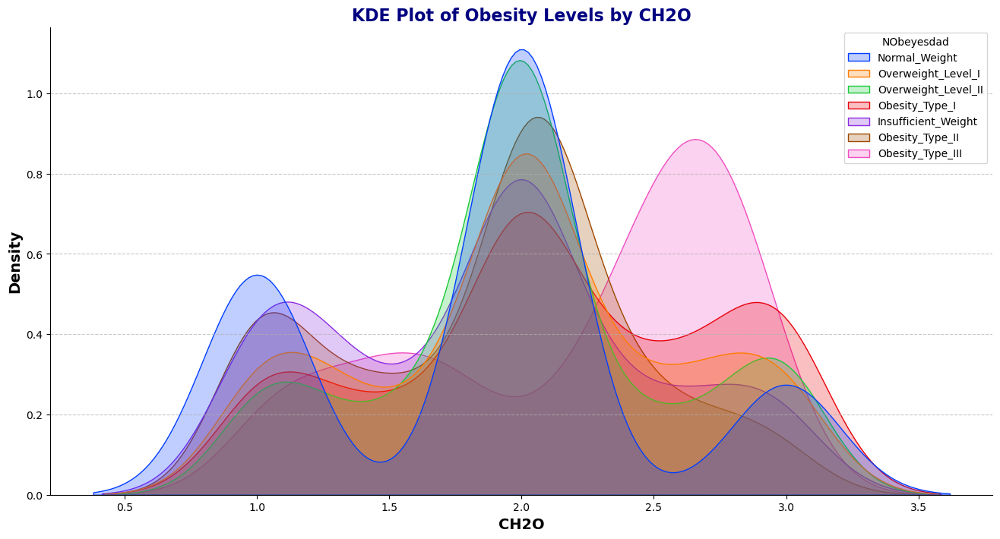

In [32]:
biivariate_numerical('CH2O')

### Obesity level by CH2O (Whether the individual monitors calorie intake)

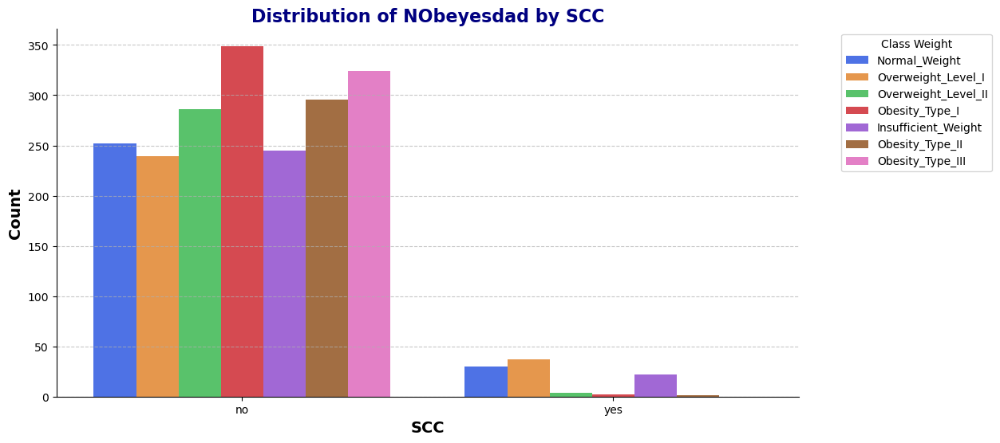

In [33]:
biivariate_categorical('SCC')

- People who monitor their calorie intake tend to have a normal or lower body weight

### Obesity level by FAF (Frequency of physical activity)

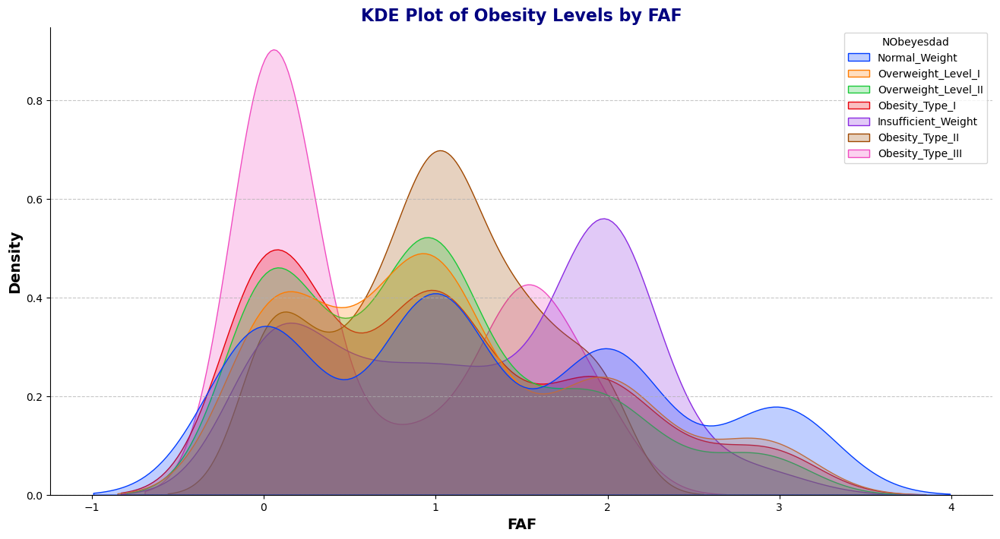

In [34]:
biivariate_numerical('FAF')

- People with low activity have a high tendency to be obese, and vice versa tend to be normal to less

### Obesity level by TUE (Time spent using technological devices)

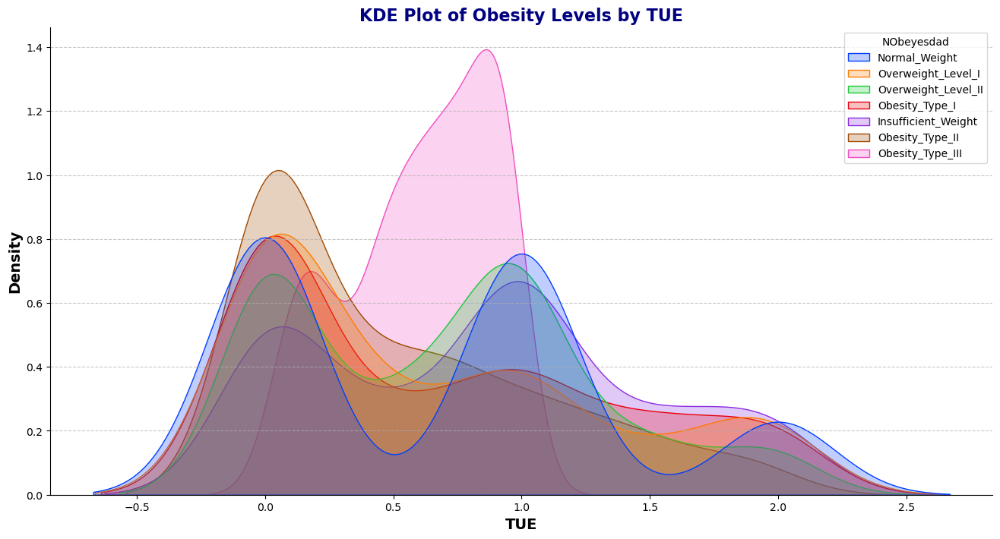

In [35]:
biivariate_numerical('TUE')

### Obesity level by CALC (Alcohol consumption frequency)

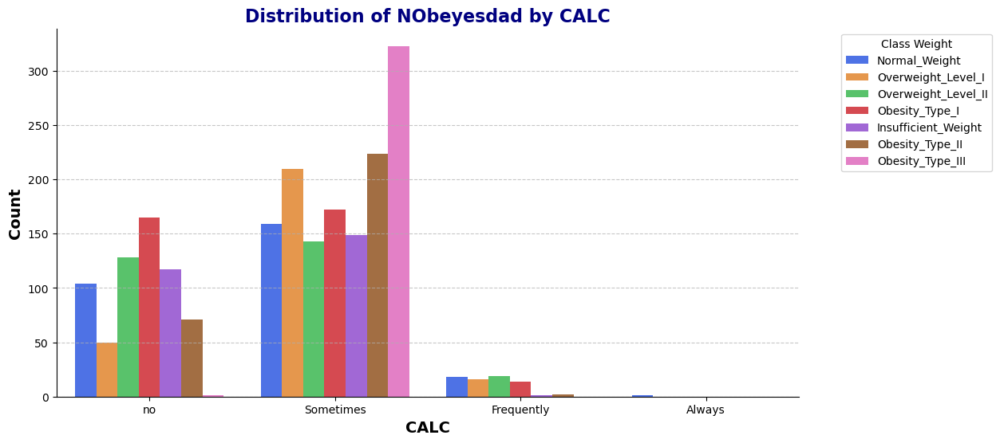

In [36]:
biivariate_categorical('CALC')

### Obesity level by MTRANS (Mode of transportation used)

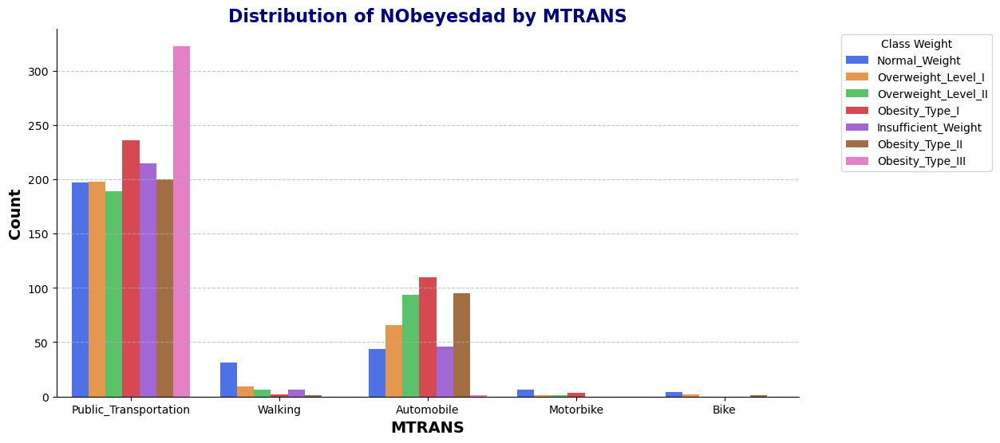

In [37]:
biivariate_categorical('MTRANS')

### Multicollinearity

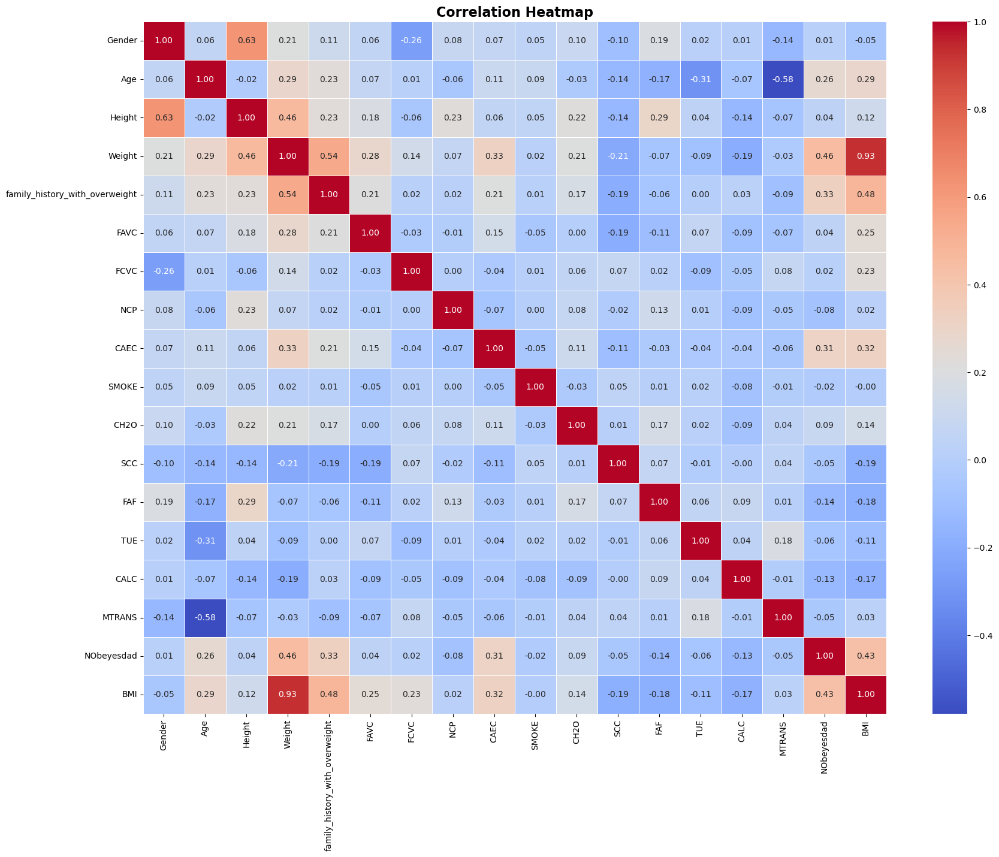

In [38]:
from sklearn.preprocessing import LabelEncoder
import json

# Initialize the label encoder
le = LabelEncoder()
categorical_features = ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS', 'NObeyesdad']
label_mappings = {}

# Apply label encoding to categorical features
for feature in categorical_features:
    df[feature] = le.fit_transform(df[feature])
    label_mappings[feature] = {str(class_label): int(encoded_label) 
                               for class_label, encoded_label in zip(le.classes_, le.transform(le.classes_))}

# Simpan label_mappings sebagai file JSON
with open('label_mappings.json', 'w') as f:
    json.dump(label_mappings, f)

# Calculate the correlation matrix
correlation_matrix = df.corr()

# Plot the heatmap
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, fmt='.2f', cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap', fontsize=16, fontweight='bold')
plt.show()

- BMI has a high correlation with weight, this causes multicollinearity, a drop in the weight feature because it has a lower correlation with obesity class and it is more difficult to differentiate class types compared to BMI

## Multivariate

In [39]:
def Multivariate_numerical(column, column2):
    plt.figure(figsize=(15, 6))

    # KDE Plot for Female
    plt.subplot(1, 2, 1)
    sns.kdeplot(data=ob_data[ob_data[column2] == 'Female'], x=column, hue='NObeyesdad', fill=True, palette='bright', common_norm=False)
    plt.title(f'KDE Plot of Obesity Levels by {column} (Female)', fontsize=16, fontweight='bold', color='navy')
    plt.xlabel(column, fontsize=14, fontweight='bold')
    plt.ylabel('Density', fontsize=14, fontweight='bold')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    sns.despine()
    female_ylim = plt.gca().get_ylim()

    # KDE Plot for Male
    plt.subplot(1, 2, 2)
    sns.kdeplot(data=ob_data[ob_data[column2] == 'Male'], x=column, hue='NObeyesdad', fill=True, palette='bright', common_norm=False)
    plt.title(f'KDE Plot of Obesity Levels by {column} (Male)', fontsize=16, fontweight='bold', color='navy')
    plt.xlabel(column, fontsize=14, fontweight='bold')
    plt.ylabel('Density', fontsize=14, fontweight='bold')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    sns.despine()
    male_ylim = plt.gca().get_ylim()

    # Set the same y-limit for both plots
    max_ylim = max(female_ylim[1], male_ylim[1])
    plt.subplot(1, 2, 1)
    plt.ylim(0, max_ylim)
    plt.subplot(1, 2, 2)
    plt.ylim(0, max_ylim)

    plt.tight_layout()
    plt.show()

In [40]:
def Multivariate_categorical(col1, col2):
    data = ob_data[[col1, col2, 'NObeyesdad']].groupby([col1, col2, 'NObeyesdad']).agg('size').reset_index(name='Count')
    g = sns.catplot(data=data, x=col1, y='Count', hue='NObeyesdad', col=col2, kind='bar', palette='bright', height=6, aspect=1.2)
    g.set_titles("{col_name} " + col2)
    g.set_axis_labels(col1, "Count")
    g._legend.set_title('Obesity Level')
    plt.subplots_adjust(top=0.85)
    g.fig.suptitle(f'Distribution of Obesity Levels by {col1} and {col2}', fontsize=16, fontweight='bold', color='navy')
    plt.show()

### Obesitas level by Age and Gender

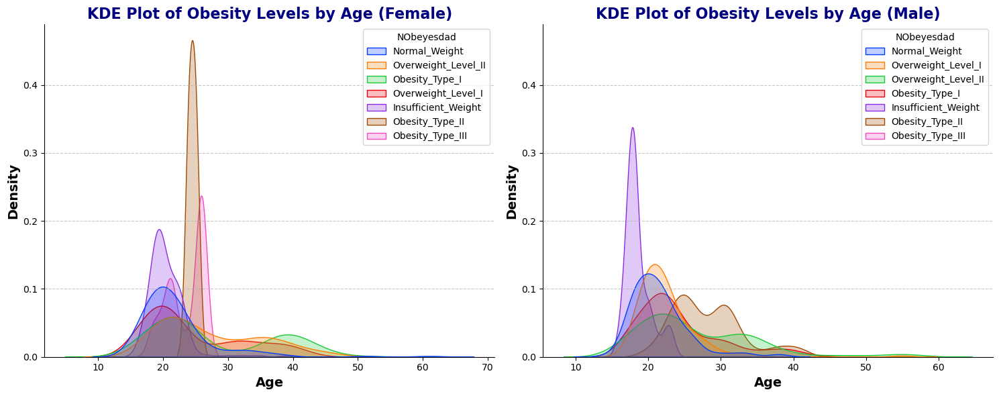

In [41]:
Multivariate_numerical('Age', 'Gender')

- Women aged 22 - 30 tend to have level 2 to level 3 obesity
- Men aged 15 - 20 years tend to be underweight

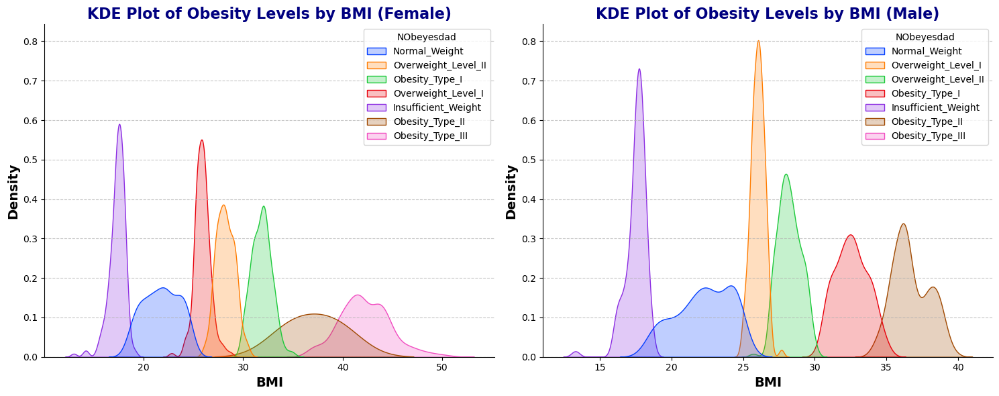

In [42]:
Multivariate_numerical('BMI', 'Gender')

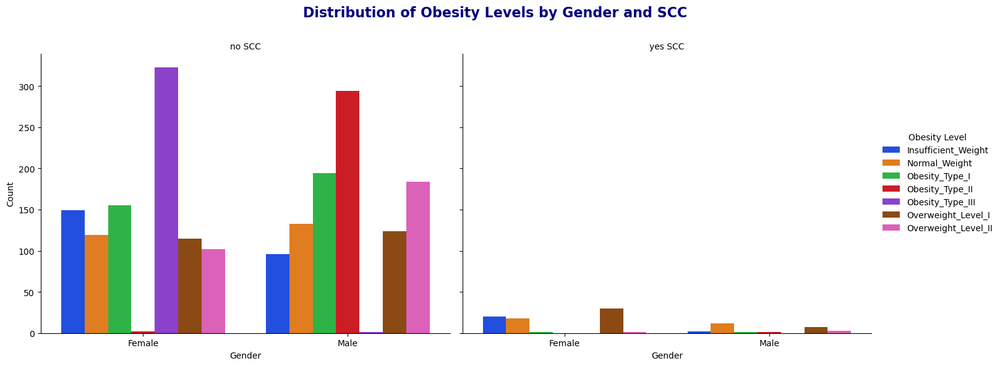

In [43]:
Multivariate_categorical('Gender', 'SCC')

# Modeling

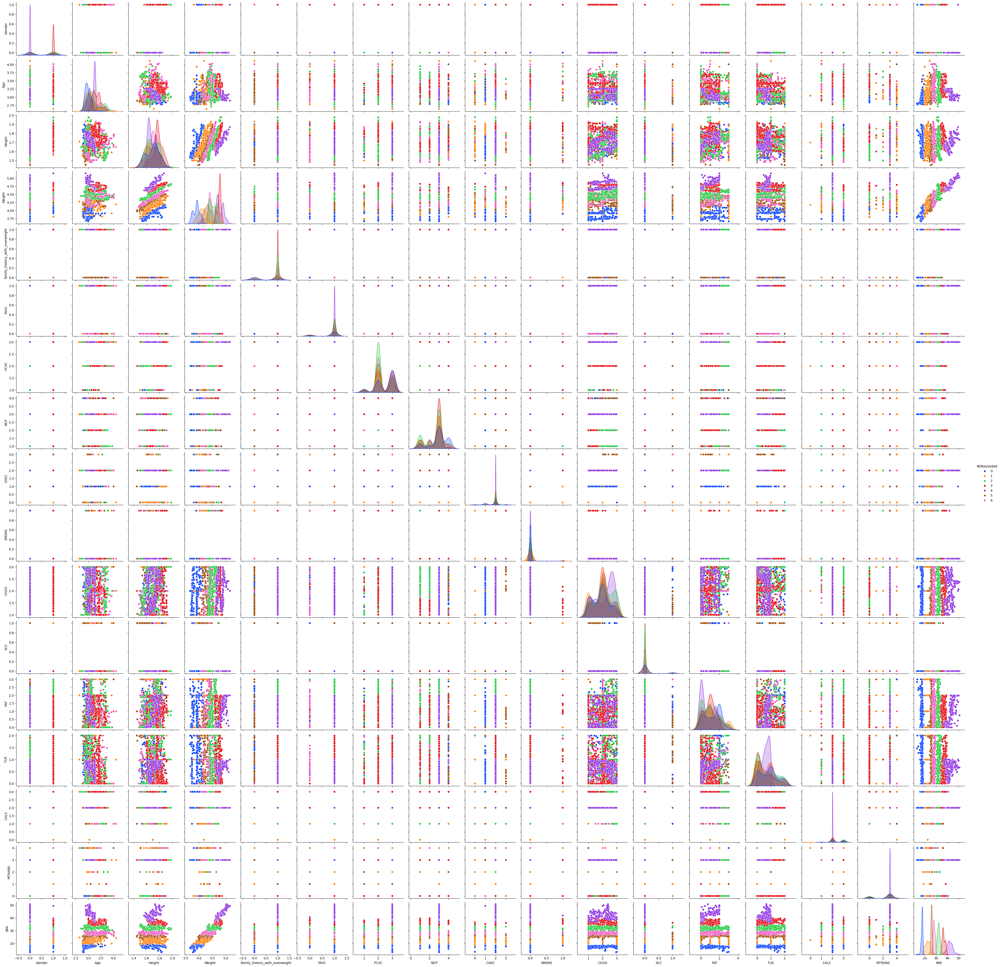

In [44]:
# Create a pairplot
sns.pairplot(df, hue='NObeyesdad', palette='bright')
plt.show()

## Logistic Regression

In [45]:
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

x_train, x_test, y_train, y_test = train_test_split(df.drop(['NObeyesdad', 'Weight'], axis=1), df['NObeyesdad'], test_size=0.2, random_state=0)
# x_train, x_test, y_train, y_test = train_test_split(df[['BMI', 'Age', 'Height', 'Gender', 'CH2O', 'FAF', 'TUE', 'FCVC', 'CAEC', 'family_history_with_overweight', 'NCP']], df['NObeyesdad'], test_size=0.25, random_state=0)

# Inisialisasi model DecisionTreeClassifier
model = LogisticRegression(random_state=11, max_iter=4000)

# Melatih model
model.fit(x_train, y_train)

# Memprediksi data uji
y_pred_train = model.predict(x_train)
y_pred_test = model.predict(x_test)

# Evaluasi model pada data train
accuracy_train = accuracy_score(y_train, y_pred_train)
report_train = classification_report(y_train, y_pred_train)

# Evaluasi model pada data test
accuracy_test = accuracy_score(y_test, y_pred_test)
report_test = classification_report(y_test, y_pred_test)

=== Train Evaluation ===
Train Accuracy: 0.973
Train Precision: 0.9734
Train Recall: 0.973
Train F1 Score: 0.973

=== Test Evaluation ===
Test Accuracy: 0.9617
Test Precision: 0.9628
Test Recall: 0.9617
Test F1 Score: 0.9617


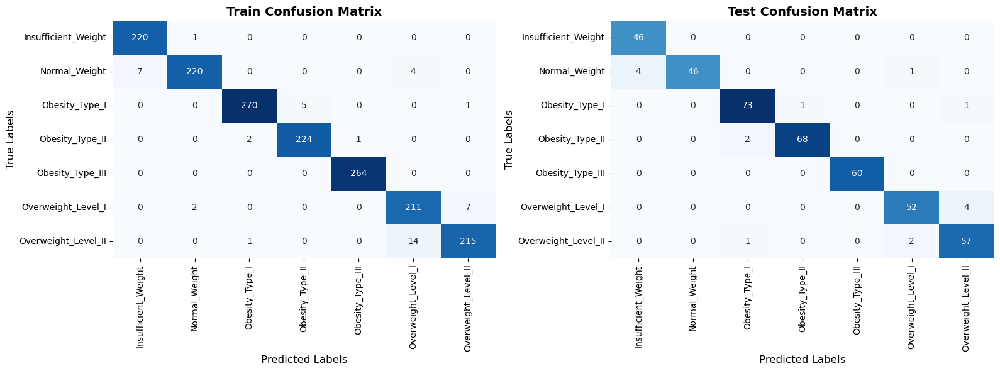

In [46]:
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, confusion_matrix

# Evaluasi model pada data train
accuracy_train = accuracy_score(y_train, y_pred_train)
precision_train = precision_score(y_train, y_pred_train, average='weighted')
recall_train = recall_score(y_train, y_pred_train, average='weighted')
f1_train = f1_score(y_train, y_pred_train, average='weighted')
confusion_matrix_train = confusion_matrix(y_train, y_pred_train)
report_train = classification_report(y_train, y_pred_train)

# Evaluasi model pada data test
accuracy_test = accuracy_score(y_test, y_pred_test)
precision_test = precision_score(y_test, y_pred_test, average='weighted')
recall_test = recall_score(y_test, y_pred_test, average='weighted')
f1_test = f1_score(y_test, y_pred_test, average='weighted')
confusion_matrix_test = confusion_matrix(y_test, y_pred_test)
report_test = classification_report(y_test, y_pred_test)

# Print hasil evaluasi
print("=== Train Evaluation ===")
print("Train Accuracy:", round(accuracy_train, 4))
print("Train Precision:", round(precision_train, 4))
print("Train Recall:", round(recall_train, 4))
print("Train F1 Score:", round(f1_train, 4))

print("\n=== Test Evaluation ===")
print("Test Accuracy:", round(accuracy_test, 4))
print("Test Precision:", round(precision_test, 4))
print("Test Recall:", round(recall_test, 4))
print("Test F1 Score:", round(f1_test, 4))

# Plot confusion matrix for train and test data
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Train Confusion Matrix
sns.heatmap(confusion_matrix_train, annot=True, fmt="d", cmap="Blues", ax=ax[0], cbar=False, 
            xticklabels=le.classes_, yticklabels=le.classes_)
ax[0].set_title("Train Confusion Matrix", fontsize=14, fontweight='bold')
ax[0].set_xlabel("Predicted Labels", fontsize=12)
ax[0].set_ylabel("True Labels", fontsize=12)

# Test Confusion Matrix
sns.heatmap(confusion_matrix_test, annot=True, fmt="d", cmap="Blues", ax=ax[1], cbar=False, 
            xticklabels=le.classes_, yticklabels=le.classes_)
ax[1].set_title("Test Confusion Matrix", fontsize=14, fontweight='bold')
ax[1].set_xlabel("Predicted Labels", fontsize=12)
ax[1].set_ylabel("True Labels", fontsize=12)

plt.tight_layout()
plt.show()

## Decision Tree

In [47]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(df.drop(['NObeyesdad', 'Weight'], axis=1), df['NObeyesdad'], test_size=0.25, random_state=0)
# x_train, x_test, y_train, y_test = train_test_split(df[['BMI', 'Age', 'Height', 'Gender', 'CH2O', 'FAF', 'TUE', 'FCVC', 'CAEC', 'family_history_with_overweight', 'NCP']], df['NObeyesdad'], test_size=0.25, random_state=0)

# Inisialisasi model DecisionTreeClassifier
model = DecisionTreeClassifier(random_state=11, max_depth=5)

# Melatih model
model.fit(x_train, y_train)

# Memprediksi data uji
y_pred_train = model.predict(x_train)
y_pred_test = model.predict(x_test)

# Evaluasi model pada data train
accuracy_train = accuracy_score(y_train, y_pred_train)
report_train = classification_report(y_train, y_pred_train)

# Evaluasi model pada data test
accuracy_test = accuracy_score(y_test, y_pred_test)
report_test = classification_report(y_test, y_pred_test)

=== Train Evaluation ===
Train Accuracy: 0.9821
Train Precision: 0.9823
Train Recall: 0.9821
Train F1 Score: 0.982

=== Test Evaluation ===
Test Accuracy: 0.977
Test Precision: 0.9773
Test Recall: 0.977
Test F1 Score: 0.977


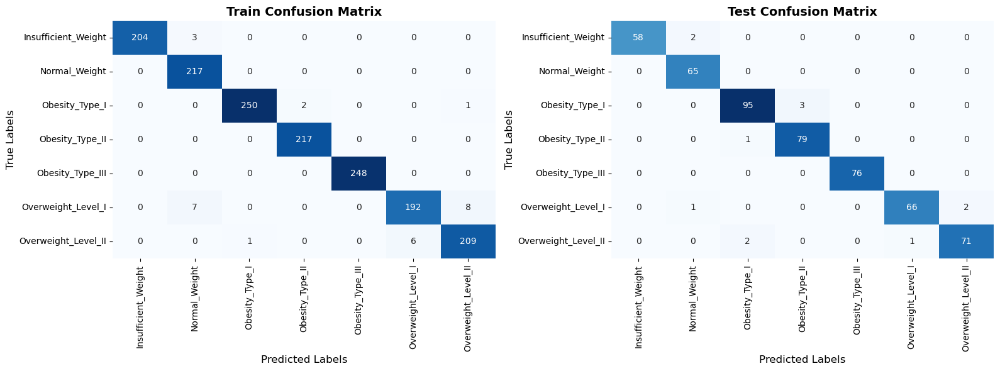

In [48]:
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, confusion_matrix

# Evaluasi model pada data train
accuracy_train = accuracy_score(y_train, y_pred_train)
precision_train = precision_score(y_train, y_pred_train, average='weighted')
recall_train = recall_score(y_train, y_pred_train, average='weighted')
f1_train = f1_score(y_train, y_pred_train, average='weighted')
confusion_matrix_train = confusion_matrix(y_train, y_pred_train)
report_train = classification_report(y_train, y_pred_train)

# Evaluasi model pada data test
accuracy_test = accuracy_score(y_test, y_pred_test)
precision_test = precision_score(y_test, y_pred_test, average='weighted')
recall_test = recall_score(y_test, y_pred_test, average='weighted')
f1_test = f1_score(y_test, y_pred_test, average='weighted')
confusion_matrix_test = confusion_matrix(y_test, y_pred_test)
report_test = classification_report(y_test, y_pred_test)

# Print hasil evaluasi
print("=== Train Evaluation ===")
print("Train Accuracy:", round(accuracy_train, 4))
print("Train Precision:", round(precision_train, 4))
print("Train Recall:", round(recall_train, 4))
print("Train F1 Score:", round(f1_train, 4))

print("\n=== Test Evaluation ===")
print("Test Accuracy:", round(accuracy_test, 4))
print("Test Precision:", round(precision_test, 4))
print("Test Recall:", round(recall_test, 4))
print("Test F1 Score:", round(f1_test, 4))

# Plot confusion matrix for train and test data
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Train Confusion Matrix
sns.heatmap(confusion_matrix_train, annot=True, fmt="d", cmap="Blues", ax=ax[0], cbar=False, 
            xticklabels=le.classes_, yticklabels=le.classes_)
ax[0].set_title("Train Confusion Matrix", fontsize=14, fontweight='bold')
ax[0].set_xlabel("Predicted Labels", fontsize=12)
ax[0].set_ylabel("True Labels", fontsize=12)

# Test Confusion Matrix
sns.heatmap(confusion_matrix_test, annot=True, fmt="d", cmap="Blues", ax=ax[1], cbar=False, 
            xticklabels=le.classes_, yticklabels=le.classes_)
ax[1].set_title("Test Confusion Matrix", fontsize=14, fontweight='bold')
ax[1].set_xlabel("Predicted Labels", fontsize=12)
ax[1].set_ylabel("True Labels", fontsize=12)

plt.tight_layout()
plt.show()

## Random Forest

In [49]:
from sklearn.ensemble import RandomForestClassifier
x_train, x_test, y_train, y_test = train_test_split(df.drop(['NObeyesdad', 'Weight'], axis=1), df['NObeyesdad'], test_size=0.2, random_state=0)

# Initialize the model
model = RandomForestClassifier(random_state=11, min_impurity_decrease=0.0001)

# Train the model
model.fit(x_train, y_train)

# Predict on the training data
y_pred_train = model.predict(x_train)

# Predict on the test data
y_pred_test = model.predict(x_test)

# Evaluate the model on the training data
accuracy_train = accuracy_score(y_train, y_pred_train)
report_train = classification_report(y_train, y_pred_train)

# Evaluate the model on the test data
accuracy_test = accuracy_score(y_test, y_pred_test)
report_test = classification_report(y_test, y_pred_test)

# Print the evaluation results
print("=== Train Evaluation ===")
print("Train Accuracy:", accuracy_train)
print("Train Classification Report:\n", report_train)

print("\n=== Test Evaluation ===")
print("Test Accuracy:", accuracy_test)
print("Test Classification Report:\n", report_test)

import joblib

# Save the model to a file
joblib.dump(model, 'random_forest_model.pkl')

=== Train Evaluation ===
Train Accuracy: 0.9994008388256441
Train Classification Report:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       221
           1       1.00      1.00      1.00       231
           2       1.00      1.00      1.00       276
           3       1.00      1.00      1.00       227
           4       1.00      1.00      1.00       264
           5       1.00      1.00      1.00       220
           6       1.00      1.00      1.00       230

    accuracy                           1.00      1669
   macro avg       1.00      1.00      1.00      1669
weighted avg       1.00      1.00      1.00      1669


=== Test Evaluation ===
Test Accuracy: 0.992822966507177
Test Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99        46
           1       0.98      1.00      0.99        51
           2       1.00      0.99      0.99        75
         

['random_forest_model.pkl']

=== Train Evaluation ===
Train Accuracy: 0.9994
Train Precision: 0.9994
Train Recall: 0.9994
Train F1 Score: 0.9994

=== Test Evaluation ===
Test Accuracy: 0.9928
Test Precision: 0.9929
Test Recall: 0.9928
Test F1 Score: 0.9928


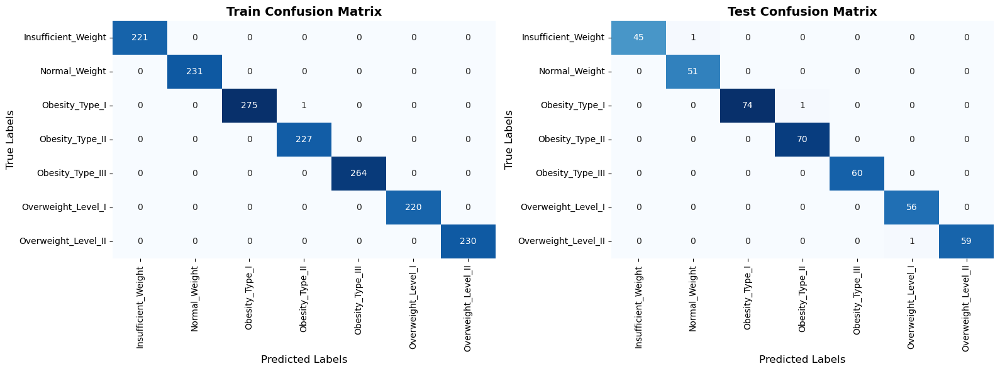

In [50]:
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score, f1_score, confusion_matrix

# Evaluasi model pada data train
accuracy_train = accuracy_score(y_train, y_pred_train)
precision_train = precision_score(y_train, y_pred_train, average='weighted')
recall_train = recall_score(y_train, y_pred_train, average='weighted')
f1_train = f1_score(y_train, y_pred_train, average='weighted')
confusion_matrix_train = confusion_matrix(y_train, y_pred_train)
report_train = classification_report(y_train, y_pred_train)

# Evaluasi model pada data test
accuracy_test = accuracy_score(y_test, y_pred_test)
precision_test = precision_score(y_test, y_pred_test, average='weighted')
recall_test = recall_score(y_test, y_pred_test, average='weighted')
f1_test = f1_score(y_test, y_pred_test, average='weighted')
confusion_matrix_test = confusion_matrix(y_test, y_pred_test)
report_test = classification_report(y_test, y_pred_test)

# Print hasil evaluasi
print("=== Train Evaluation ===")
print("Train Accuracy:", round(accuracy_train, 4))
print("Train Precision:", round(precision_train, 4))
print("Train Recall:", round(recall_train, 4))
print("Train F1 Score:", round(f1_train, 4))

print("\n=== Test Evaluation ===")
print("Test Accuracy:", round(accuracy_test, 4))
print("Test Precision:", round(precision_test, 4))
print("Test Recall:", round(recall_test, 4))
print("Test F1 Score:", round(f1_test, 4))

# Plot confusion matrix for train and test data
fig, ax = plt.subplots(1, 2, figsize=(16, 6))

# Train Confusion Matrix
sns.heatmap(confusion_matrix_train, annot=True, fmt="d", cmap="Blues", ax=ax[0], cbar=False, 
            xticklabels=le.classes_, yticklabels=le.classes_)
ax[0].set_title("Train Confusion Matrix", fontsize=14, fontweight='bold')
ax[0].set_xlabel("Predicted Labels", fontsize=12)
ax[0].set_ylabel("True Labels", fontsize=12)

# Test Confusion Matrix
sns.heatmap(confusion_matrix_test, annot=True, fmt="d", cmap="Blues", ax=ax[1], cbar=False, 
            xticklabels=le.classes_, yticklabels=le.classes_)
ax[1].set_title("Test Confusion Matrix", fontsize=14, fontweight='bold')
ax[1].set_xlabel("Predicted Labels", fontsize=12)
ax[1].set_ylabel("True Labels", fontsize=12)

plt.tight_layout()
plt.show()

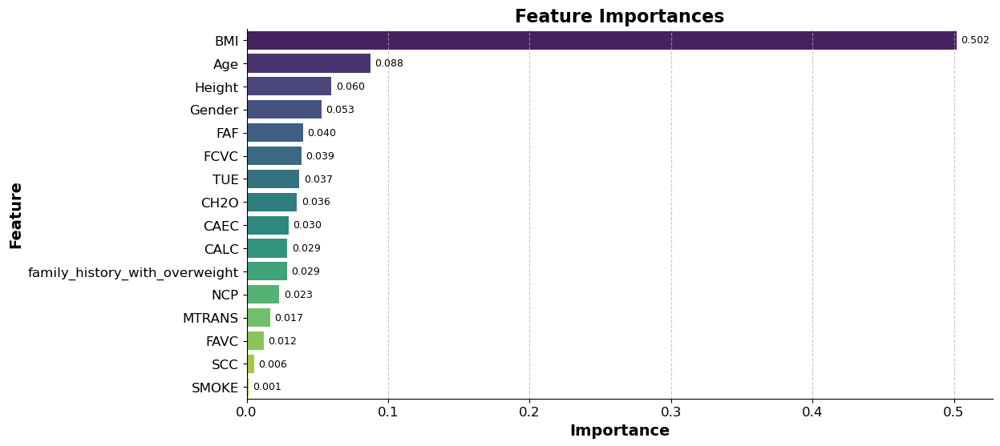

In [51]:
# Menampilkan feature importance
importances = model.feature_importances_
feature_names = x_train.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)

# Plotting feature importances
plt.figure(figsize=(12, 6))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df, palette='viridis')
plt.title('Feature Importances', fontsize=16, fontweight='bold')
plt.xlabel('Importance', fontsize=14, fontweight='bold')
plt.ylabel('Feature', fontsize=14, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
sns.despine()

# Adding the values to the right of the bars
for index, value in enumerate(feature_importance_df['Importance']):
    plt.text(value + 0.003, index, f'{value:.3f}', va='center', ha='left', fontsize=9, color='black')

plt.show()

In [56]:
import lime
import lime.lime_tabular

# Create a LIME explainer
explainer = lime.lime_tabular.LimeTabularExplainer(
    training_data=np.array(x_train),
    feature_names=x_train.columns,
    class_names=le.classes_,
    mode='classification',
    
)

# Choose an instance to explain
i = 1
exp = explainer.explain_instance(
    data_row=x_test.iloc[i],
    predict_fn=model.predict_proba
)

# Plot the explanation
exp.show_in_notebook(show_table=True, show_all=False)